In [1]:
%pip install captum

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


# H&E Breast Cancer Classification with Vision Transformer (ViT)

This notebook demonstrates the fine-tuning of a Vision Transformer (ViT) model for the classification of H&E stained breast cancer histopathology images into four categories:
1. **Benign** - Non-cancerous lesions
2. **InSitu** - Carcinoma in situ (cancer cells that have not invaded surrounding tissues)
3. **Invasive** - Invasive carcinoma (cancer cells that have invaded surrounding tissues)
4. **Normal** - Normal breast tissue

## Model Performance Summary

The pre-trained ViT model was fine-tuned on our dataset with the following results:

- **Training Accuracy**: ~97% (final epoch)
- **Validation Accuracy**: ~76% (final epoch)
- **Best Validation Accuracy**: ~76%

The confusion matrix and classification report show that:
- The model performs well on InSitu and Invasive classes
- There is some confusion between Benign and other classes
- The model achieved an overall F1-score of 0.75 (weighted average)

## Observations

1. **Overfitting**: The gap between training and validation accuracy indicates some overfitting. This could be addressed by:
   - Using data augmentation
   - Adding regularization (dropout, weight decay)
   - Collecting more training data

2. **Class Performance**:
   - InSitu class has high recall (100%) but lower precision (65%)
   - Benign class has good precision (87%) but lower recall (52%)
   - Invasive and Normal classes have more balanced precision and recall

3. **Model Saving**:
   - The best model was saved as 'finetuned_vit_breastcancer.pth'
   - This can be loaded for inference on new images

4. **Potential Improvements**:
   - Try different learning rates or schedulers
   - Implement more aggressive data augmentation
   - Try different architectures or ensemble methods
   - Explore attention visualization to understand model decision-making

In [2]:
import os , math, time, copy , torch, random
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torchvision.models import vit_b_16, ViT_B_16_Weights
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd

In [3]:
# config

data_dir = "./Photos/"
test_dir = "./test/"
# this will the define the index to classes mapping the index of the classname define index
subdirs=['Benign', 'InSitu', "Invasive", "Normal"] 
num_classes = len(subdirs)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


In [4]:
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a smaller size to save memory
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

Dataset loaded with 400 images across 4 classes
Test dataset loaded with 100 images
Train dataset size: 320
Validation dataset size: 80
Test dataset size: 100
Batch shape: torch.Size([8, 3, 224, 224])
Labels: tensor([2, 2, 2, 3, 3, 2, 2, 0])
First image path: ./Photos/Invasive/iv019.tif
Batch shape: torch.Size([8, 3, 224, 224])
Labels: tensor([2, 2, 2, 3, 3, 2, 2, 0])
First image path: ./Photos/Invasive/iv019.tif


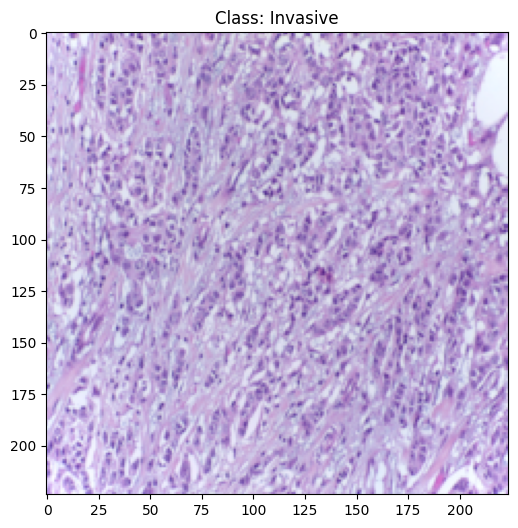

In [5]:
class HnEDataset(Dataset):
    def __init__(self, root_dir, transform=None, samples=None):
        """
        Args:
            root_dir (string): Directory with all the images organized in class subdirectories
            transform (callable, optional): Optional transform to be applied on a sample
            samples (list, optional): Optional list of samples to use instead of scanning the directory
        """
        self.root_dir = root_dir
        self.transform = transform
        self.classes = subdirs  # Using the predefined subdirs
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(self.classes)}
        
        # If samples are provided, use them directly (for subsetting)
        if samples is not None:
            self.samples = samples
        else:
            # Otherwise scan the directory for images - just store paths, not images
            self.samples = []
            
            # Walk through all subdirectories and collect image paths with their labels
            for class_name in self.classes:
                class_dir = os.path.join(root_dir, class_name)
                if not os.path.isdir(class_dir):
                    print(f"Warning: {class_dir} is not a directory or doesn't exist")
                    continue
                    
                class_idx = self.class_to_idx[class_name]
                for img_name in os.listdir(class_dir):
                    if img_name.lower().endswith(('.tif')):
                        img_path = os.path.join(class_dir, img_name)
                        self.samples.append((img_path, class_idx))
            
            print(f"Dataset loaded with {len(self.samples)} images across {len(self.classes)} classes")
        
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        # Handle both integer indexing and list/array indexing
        if isinstance(idx, (list, np.ndarray)):
            # If we're passed a list of indices, return a new dataset with those samples
            # Just pass the sample info, not the actual images
            selected_samples = [self.samples[i] for i in idx]
            return HnEDataset(root_dir=self.root_dir, transform=self.transform, 
                              samples=selected_samples)
        elif isinstance(idx, slice):
            # Create a new dataset with the sliced samples
            # Again, just passing references, not loading images
            return HnEDataset(root_dir=self.root_dir, transform=self.transform, 
                              samples=self.samples[idx])
        else:
            # Handle integer indexing for regular access
            img_path, label = self.samples[idx]
            
            # Only load the image when it's actually requested
            try:
                image = Image.open(img_path).convert('RGB')
                
                if self.transform:
                    image = self.transform(image)
                
                return image, label, img_path
            except Exception as e:
                print(f"Error loading image {img_path}: {str(e)}")
                # Return a placeholder image in case of error
                # Create a small black image as placeholder
                placeholder = torch.zeros((3, 224, 224))
                return placeholder, label, img_path

# New class for test dataset without subdirectories
class TestHnEDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (string): Directory with all the test images (no subdirectories)
            transform (callable, optional): Optional transform to be applied on a sample
        """
        self.root_dir = root_dir
        self.transform = transform
        self.classes = subdirs  # Using the predefined subdirs
        
        # Scan the directory for images - just store paths, not the actual images
        self.samples = []
        
        # Check if the directory exists
        if not os.path.isdir(root_dir):
            print(f"Warning: {root_dir} is not a directory or doesn't exist")
            return
            
        # Get all image files directly from the test directory
        for img_name in os.listdir(root_dir):
            if img_name.lower().endswith(('.tif')):
                img_path = os.path.join(root_dir, img_name)
                
                # For test set, we don't know the label yet, so we'll assign None or -1
                # You can modify this later to infer label from filename if needed
                label = -1  # Using -1 as a placeholder for unknown label
                self.samples.append((img_path, label))
        
        print(f"Test dataset loaded with {len(self.samples)} images")
        
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        # Handle integer indexing for regular access
        img_path, label = self.samples[idx]
        
        # Only load the image when it's actually requested
        try:
            image = Image.open(img_path).convert('RGB')
            
            if self.transform:
                image = self.transform(image)
            
            return image, label, img_path
        except Exception as e:
            print(f"Error loading image {img_path}: {str(e)}")
            # Return a placeholder image in case of error
            placeholder = torch.zeros((3, 224, 224))
            return placeholder, label, img_path

# Create dataset instance for training data
full_dataset = HnEDataset(
    root_dir=data_dir,
    transform=data_transforms  # Using the transforms defined earlier
)

# Create train/val split using indices
val_size = 80  # Number of samples for validation
dataset_size = len(full_dataset)
indices = list(range(dataset_size))
# Set random seed for reproducibility
random.seed(42)  
random.shuffle(indices)  # Shuffle for randomization
train_indices = indices[val_size:]
val_indices = indices[:val_size]

# Create train and validation datasets using the modified __getitem__ method
train_dataset = full_dataset[train_indices]
val_dataset = full_dataset[val_indices]

# Create test dataset separately, using the new TestHnEDataset class
test_dataset = TestHnEDataset(
    root_dir=test_dir,
    transform=data_transforms  # Using the transforms defined earlier
)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

# Create data loaders with memory-optimized settings
batch_size = 8  # Reduced batch size
train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size,
    shuffle=True,
    num_workers=2,  # Reduced number of workers
    pin_memory=False,  # Disable pin memory to reduce memory usage
    prefetch_factor=2 if torch.__version__ >= '1.7.0' else None,  # Reduce prefetch
)

# Test the data loader with a single batch and single image to minimize memory usage
for images, labels, paths in train_loader:
    print(f"Batch shape: {images.shape}")
    print(f"Labels: {labels}")
    print(f"First image path: {paths[0]}")
    
    # Visualize only the first image
    plt.figure(figsize=(6, 6))  # Smaller figure size
    img = images[0].permute(1, 2, 0).numpy()
    # Denormalize for visualization
    img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img = np.clip(img, 0, 1)
    plt.imshow(img)
    plt.title(f"Class: {subdirs[labels[0]]}")
    plt.show()
    break  # Only process one batch

Test batch shape: torch.Size([8, 3, 224, 224])
Test first image path: ./test/test61.tif


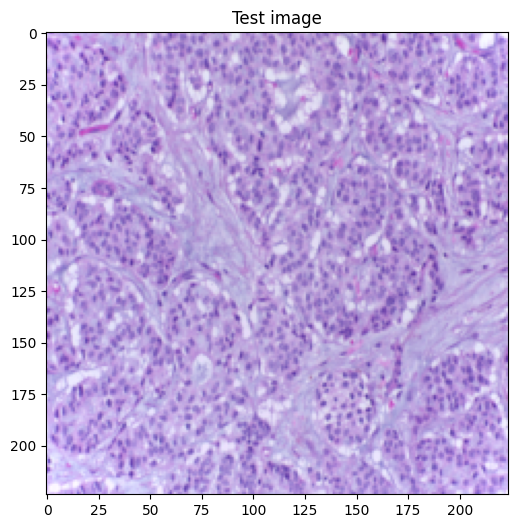

In [6]:
# Create data loaders for train, validation and test sets with memory-optimized settings
batch_size = 8  # Smaller batch size to reduce memory usage

train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size,
    shuffle=True,
    num_workers=2,  # Reduced worker threads
    pin_memory=False,  # Disable pin memory to reduce memory usage
    prefetch_factor=2 if torch.__version__ >= '1.7.0' else None  # Reduce prefetch
)

val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size,
    shuffle=False,
    num_workers=2,  # Reduced worker threads
    pin_memory=False,  # Disable pin memory
    prefetch_factor=2 if torch.__version__ >= '1.7.0' else None  # Reduce prefetch
)

# Note: Test loader only created if there are test images
if len(test_dataset) > 0:
    test_loader = DataLoader(
        test_dataset, 
        batch_size=batch_size,
        shuffle=False,
        num_workers=2,  # Reduced worker threads
        pin_memory=False,  # Disable pin memory
        prefetch_factor=2 if torch.__version__ >= '1.7.0' else None  # Reduce prefetch
    )
    
    # Visualize a single sample from test loader
    for images, labels, paths in test_loader:
        print(f"Test batch shape: {images.shape}")
        print(f"Test first image path: {paths[0]}")
        
        plt.figure(figsize=(6, 6))  # Smaller figure size
        img = images[0].permute(1, 2, 0).numpy()
        # Denormalize for visualization
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        plt.imshow(img)
        plt.title("Test image")
        plt.show()
        break
else:
    print("No test images found. Test loader not created.")
    test_loader = None

In [7]:
# Load pre-trained ViT model
model = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)

# Freeze all parameters
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the classifier head for fine-tuning
in_features = model.heads.head.in_features
model.heads.head = nn.Linear(in_features, num_classes)

# Move model to device
model = model.to(device)

print(f"Model loaded on {device}")
print(f"Model architecture: {model.__class__.__name__}")
print(f"Number of classes: {num_classes}")

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
# Only optimize parameters of the classifier head
optimizer = torch.optim.Adam(model.heads.parameters(), lr=0.001)

# Define learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=2
)

# Training function
def train_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for inputs, labels, _ in dataloader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Zero the parameter gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        
        # Backward pass and optimize
        loss.backward()
        optimizer.step()
        
        # Statistics
        running_loss += loss.item() * inputs.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
    
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc

# Validation function
def validate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels, _ in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Statistics
            running_loss += loss.item() * inputs.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc

Model loaded on cuda:0
Model architecture: VisionTransformer
Number of classes: 4


In [8]:
# Training loop
num_epochs = 20
train_losses = []
train_accs = []
val_losses = []
val_accs = []
best_val_acc = 0.0
start_time = time.time()

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    
    # Train
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    train_accs.append(train_acc)
    
    # Validate
    val_loss, val_acc = validate(model, val_loader, criterion, device)
    val_losses.append(val_loss)
    val_accs.append(val_acc)
    
    # Update scheduler based on validation accuracy
    scheduler.step(val_acc)
    
    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        # Save the model checkpoint
        torch.save(model.state_dict(), 'finetuned_vit_model_classifier.pth')
        print(f"Model saved with validation accuracy: {val_acc:.4f}")
    
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    print("-" * 50)

elapsed_time = time.time() - start_time
print(f"Training complete in {elapsed_time//60:.0f}m {elapsed_time%60:.0f}s")
print(f"Best validation accuracy: {best_val_acc:.4f}")

# Load the best model
model.load_state_dict(torch.load('finetuned_vit_model_classifier.pth'))
print("Best model loaded")

Epoch 1/20
Model saved with validation accuracy: 0.6125
Train Loss: 1.1100, Train Acc: 0.5125
Val Loss: 0.9807, Val Acc: 0.6125
--------------------------------------------------
Epoch 2/20
Model saved with validation accuracy: 0.6125
Train Loss: 1.1100, Train Acc: 0.5125
Val Loss: 0.9807, Val Acc: 0.6125
--------------------------------------------------
Epoch 2/20
Model saved with validation accuracy: 0.6250
Train Loss: 0.7179, Train Acc: 0.7531
Val Loss: 0.7920, Val Acc: 0.6250
--------------------------------------------------
Epoch 3/20
Model saved with validation accuracy: 0.6250
Train Loss: 0.7179, Train Acc: 0.7531
Val Loss: 0.7920, Val Acc: 0.6250
--------------------------------------------------
Epoch 3/20
Model saved with validation accuracy: 0.7125
Train Loss: 0.5661, Train Acc: 0.8156
Val Loss: 0.7110, Val Acc: 0.7125
--------------------------------------------------
Epoch 4/20
Model saved with validation accuracy: 0.7125
Train Loss: 0.5661, Train Acc: 0.8156
Val Loss: 0

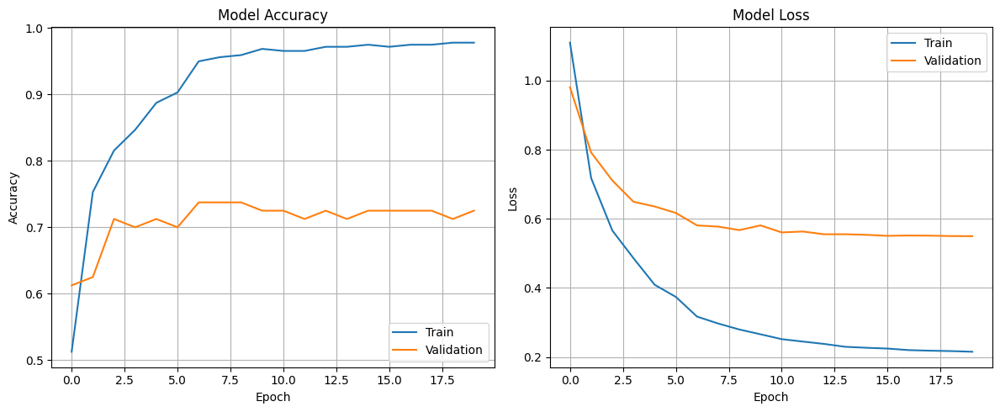

Test Accuracy: 0.0000


In [9]:
# Plot training and validation accuracy curves
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(train_accs, label='Train')
plt.plot(val_accs, label='Validation')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid(True)

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(train_losses, label='Train')
plt.plot(val_losses, label='Validation')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)

plt.tight_layout()
plt.show()

# Evaluate on test set
if test_loader is not None:
    model.eval()
    test_correct = 0
    test_total = 0
    test_predictions = []
    test_labels_list = []
    test_paths_list = []
    
    with torch.no_grad():
        for inputs, labels, paths in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            
            test_total += labels.size(0)
            test_correct += (predicted == labels).sum().item()
            
            # Store predictions and actual labels
            test_predictions.extend(predicted.cpu().numpy())
            test_labels_list.extend(labels.cpu().numpy())
            test_paths_list.extend(paths)
    
    test_accuracy = test_correct / test_total
    print(f"Test Accuracy: {test_accuracy:.4f}")
    
    # If labels for test data are available (-1 means unavailable)
    if -1 not in test_labels_list:
        # Create confusion matrix
        from sklearn.metrics import confusion_matrix, classification_report
        import seaborn as sns
        
        cm = confusion_matrix(test_labels_list, test_predictions)
        
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                    xticklabels=subdirs, yticklabels=subdirs)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title('Confusion Matrix')
        plt.show()
        
        # Print classification report
        print(classification_report(test_labels_list, test_predictions, target_names=subdirs))

Validation Set Predictions:


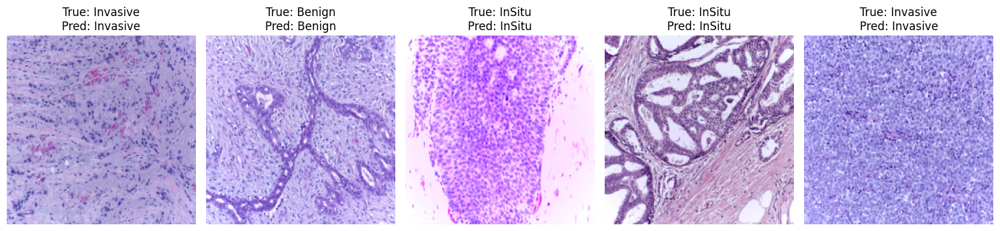

Model saved to 'finetuned_vit_breastcancer.pth'


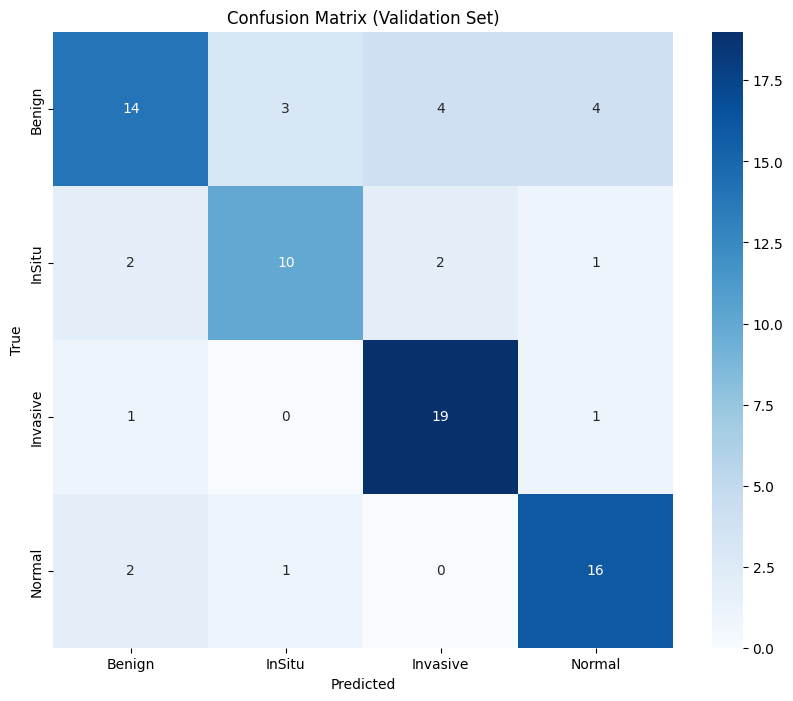

Classification Report (Validation Set):
              precision    recall  f1-score   support

      Benign       0.74      0.56      0.64        25
      InSitu       0.71      0.67      0.69        15
    Invasive       0.76      0.90      0.83        21
      Normal       0.73      0.84      0.78        19

    accuracy                           0.74        80
   macro avg       0.73      0.74      0.73        80
weighted avg       0.74      0.74      0.73        80



In [10]:
# Visualize predictions on validation samples
def show_predictions(model, dataloader, num_samples=5):
    model.eval()
    all_images = []
    all_labels = []
    all_preds = []
    all_paths = []
    
    with torch.no_grad():
        for images, labels, paths in dataloader:
            if len(all_images) >= num_samples:
                break
                
            inputs = images.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            # Add batch samples to lists
            all_images.extend(images.cpu())
            all_labels.extend(labels.cpu())
            all_preds.extend(preds.cpu())
            all_paths.extend(paths)
            
            if len(all_images) >= num_samples:
                all_images = all_images[:num_samples]
                all_labels = all_labels[:num_samples]
                all_preds = all_preds[:num_samples]
                all_paths = all_paths[:num_samples]
                break
    
    # Plot images with predictions
    fig, axes = plt.subplots(1, min(num_samples, len(all_images)), figsize=(15, 4))
    if num_samples == 1:
        axes = [axes]
        
    for i, (img, label, pred, path) in enumerate(zip(all_images, all_labels, all_preds, all_paths)):
        img = img.permute(1, 2, 0).numpy()
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        
        axes[i].imshow(img)
        axes[i].set_title(f"True: {subdirs[label]}\nPred: {subdirs[pred]}")
        axes[i].axis('off')
        
    plt.tight_layout()
    plt.show()
    
# Show predictions on validation data
print("Validation Set Predictions:")
show_predictions(model, val_loader, num_samples=5)

# Save the final model
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'val_acc': best_val_acc,
    'train_accs': train_accs,
    'val_accs': val_accs,
    'train_losses': train_losses,
    'val_losses': val_losses,
}, 'finetuned_vit_breastcancer.pth')

print("Model saved to 'finetuned_vit_breastcancer.pth'")

# Optional: Create a classification report for validation data
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def get_predictions(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels, _ in dataloader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
    
    return np.array(all_labels), np.array(all_preds)

# Get validation predictions
val_labels, val_preds = get_predictions(model, val_loader, device)

# Create confusion matrix
cm = confusion_matrix(val_labels, val_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=subdirs, yticklabels=subdirs)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Validation Set)')
plt.show()

# Print classification report
print("Classification Report (Validation Set):")
print(classification_report(val_labels, val_preds, target_names=subdirs))

Selected image: ./Photos/InSitu/is060.tif
True class: InSitu


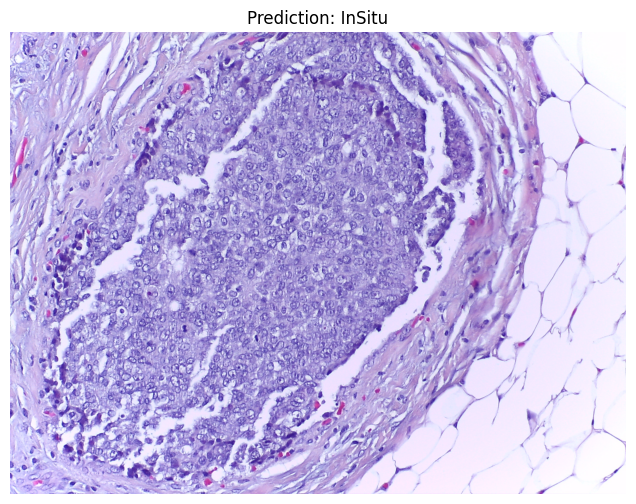

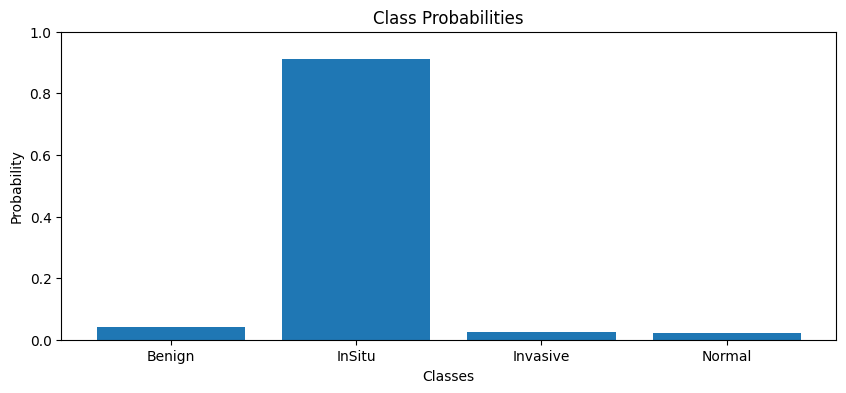

Benign: 4.18%
InSitu: 91.22%
Invasive: 2.38%
Normal: 2.23%


In [11]:
# Function to predict on new images
def predict_image(image_path, model, transform):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    
    # Move to device and predict
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        _, predicted = torch.max(outputs, 1)
        probabilities = F.softmax(outputs, dim=1)
    
    # Get prediction and probabilities
    predicted_class = subdirs[predicted.item()]
    probabilities = probabilities.cpu().numpy()[0]
    
    # Display image with prediction
    plt.figure(figsize=(8, 6))
    
    # Display the image
    img_np = np.array(image)
    plt.imshow(img_np)
    plt.axis('off')
    plt.title(f'Prediction: {predicted_class}')
    
    # Display probability bar chart
    plt.figure(figsize=(10, 4))
    plt.bar(subdirs, probabilities)
    plt.xlabel('Classes')
    plt.ylabel('Probability')
    plt.title('Class Probabilities')
    plt.ylim(0, 1.0)
    plt.show()
    
    # Print results
    for i, cls in enumerate(subdirs):
        print(f"{cls}: {probabilities[i]*100:.2f}%")
    
    return predicted_class, probabilities

# Try with a validation example - pick one example from validation set
val_samples = []
for images, labels, paths in val_loader:
    val_samples = [(paths[i], labels[i].item()) for i in range(len(paths))]
    break

# Select a random sample
import random
sample_path, sample_label = random.choice(val_samples)
print(f"Selected image: {sample_path}")
print(f"True class: {subdirs[sample_label]}")

# Predict on the selected image
predicted_class, _ = predict_image(sample_path, model, data_transforms)

In [12]:
# # Import required libraries
# import cv2
# from scipy.ndimage import zoom
# from captum.attr import visualization as viz
# from captum.attr import LayerGradCam, LayerAttribution

# # Let's use captum library for visualization - it works well with PyTorch models
# def visualize_heatmap_on_image(image_path, model, transform):
#     """
#     Visualize feature importance heatmaps on an image using Layer GradCAM
#     """
#     # Load and preprocess the image
#     original_image = Image.open(image_path).convert('RGB')
#     input_tensor = transform(original_image).unsqueeze(0).to(device)
    
#     # Get model prediction
#     with torch.no_grad():
#         output = model(input_tensor)
#         _, prediction = torch.max(output, 1)
#         predicted_class = subdirs[prediction.item()]
    
#     # Convert the original image to numpy array for visualization
#     original_np = np.array(original_image)
    
#     # Create Grad-CAM for the last block in the ViT encoder
#     layer_gc = LayerGradCam(model, model.encoder.layers[-1])
#     gc_attr = layer_gc.attribute(input_tensor, target=prediction.item())
    
#     # Upsample to input resolution
#     upsampled_attr = LayerAttribution.interpolate(gc_attr, (original_np.shape[0], original_np.shape[1]))
    
#     # Normalize the attribution for visualization
#     heatmap = upsampled_attr.squeeze().cpu().detach().numpy()
#     heatmap = np.maximum(heatmap, 0)  # ReLU to keep only positive influence
#     heatmap = heatmap / np.max(heatmap)  # Normalize to [0, 1]
    
#     # Create visualization
#     fig, axs = plt.subplots(1, 3, figsize=(20, 7))
    
#     # Display original image
#     axs[0].imshow(original_np)
#     axs[0].set_title(f"Original Image\nTrue class: {subdirs[sample_label]}")
#     axs[0].axis('off')
    
#     # Display heatmap
#     im = axs[1].imshow(heatmap, cmap='jet')
#     axs[1].set_title("Feature Importance Heatmap")
#     axs[1].axis('off')
#     plt.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)
    
#     # Create a colored heatmap
#     heatmap_colored = np.uint8(255 * heatmap)
#     heatmap_colored = cv2.applyColorMap(heatmap_colored, cv2.COLORMAP_JET)
#     heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
#     # Overlay heatmap on original image
#     alpha = 0.4  # Transparency factor
#     overlay = heatmap_colored * alpha + original_np * (1 - alpha)
#     overlay = np.clip(overlay, 0, 255).astype(np.uint8)
    
#     # Display overlay
#     axs[2].imshow(overlay)
#     axs[2].set_title(f"Attention Overlay\nPredicted: {predicted_class}")
#     axs[2].axis('off')
    
#     plt.tight_layout()
#     plt.show()
    
#     return predicted_class, heatmap

# # Let's check if captum is installed
# try:
#     from captum.attr import LayerGradCam
#     print("Captum is already installed.")
# except ImportError:
#     print("Installing Captum...")
#     !pip install captum
#     from captum.attr import LayerGradCam
#     print("Captum has been installed.")
    
# # Choose a sample image to visualize
# sample_path, sample_label = random.choice(val_samples)
# print(f"Selected image: {sample_path}")
# print(f"True class: {subdirs[sample_label]}")

# # Visualize feature importance
# print("\nVisualizing feature importance heatmap")
# predicted_class, _ = visualize_heatmap_on_image(
#     sample_path, model, data_transforms
# )

# # Try images from different classes
# print("\nVisualizing images from different classes:")
# for class_idx, class_name in enumerate(subdirs):
#     # Find a sample from this class
#     class_samples = [(path, label) for path, label in val_samples if label == class_idx]
#     if class_samples:
#         path, label = random.choice(class_samples)
#         print(f"\nClass: {class_name}")
#         visualize_heatmap_on_image(path, model, data_transforms)

Generating attention map visualization from last layer...


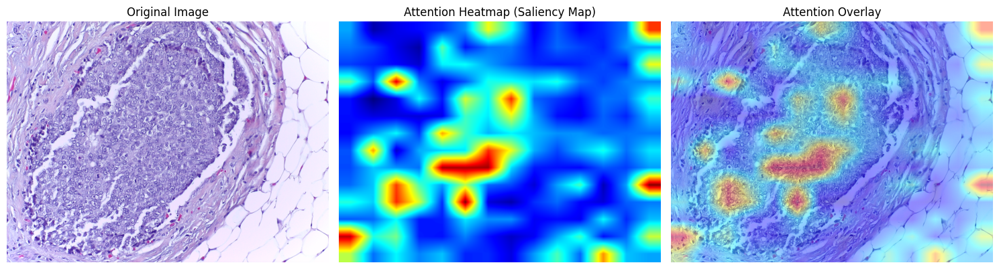


Generating multi-layer attention visualization...
Layers: 0 (early), 5 (middle), 11 (late)
torch.Size([1, 197, 768]) torch.Size([1, 197, 768]) torch.Size([1, 197, 768])
torch.Size([1, 197, 768]) torch.Size([1, 197, 768]) torch.Size([1, 197, 768])
torch.Size([1, 197, 768]) torch.Size([1, 197, 768]) torch.Size([1, 197, 768])


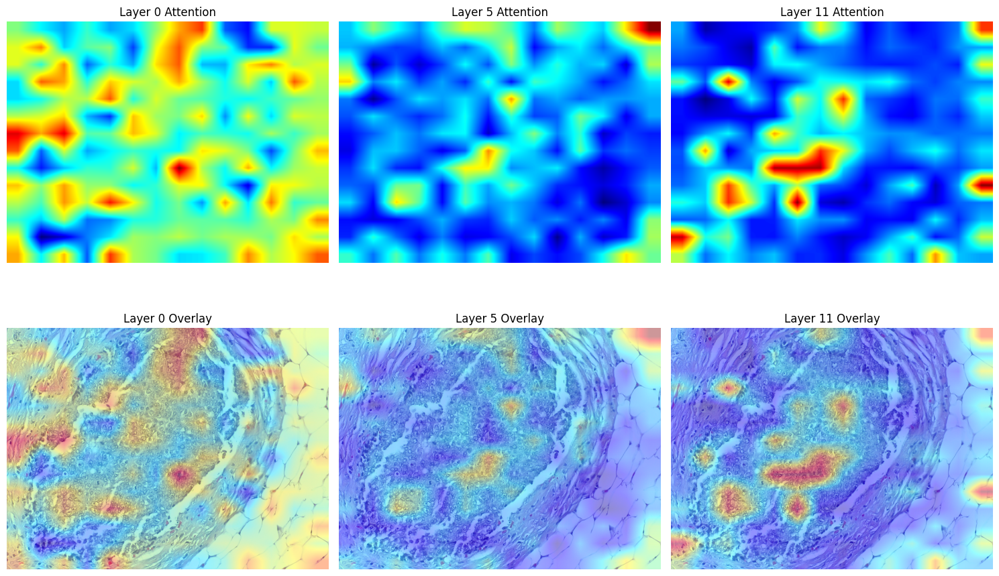

In [13]:
# Make sure OpenCV is installed
import cv2

def visualize_attention_map(image_path, model, transform):
    """
    Visualize feature importance using attention weights from the ViT encoder.
    Uses a clean hook-based approach to extract attention weights by computing them
    directly from Q, K, V matrices without modifying the forward method.
    """
    image = Image.open(image_path).convert('RGB')
    original_np = np.array(image)
    x = transform(image).unsqueeze(0).to(next(model.parameters()).device)

    # Storage for attention weights
    attn_weights = []

    def hook_fn(module, input, output):
        """
        Hook function to compute attention weights from Q, K, V inputs.
        Computes: Attention = softmax(Q @ K.T / sqrt(d_k))
        """
        # Input is a tuple: (query, key, value)
        query, key, value = input[0], input[1], input[2]
        
        # Get dimensions
        batch_size, seq_len, embed_dim = query.shape
        num_heads = module.num_heads
        head_dim = embed_dim // num_heads
        
        # Reshape for multi-head attention
        # [batch, seq_len, embed_dim] -> [batch, num_heads, seq_len, head_dim]
        q = query.reshape(batch_size, seq_len, num_heads, head_dim).permute(0, 2, 1, 3)
        k = key.reshape(batch_size, seq_len, num_heads, head_dim).permute(0, 2, 1, 3)
        
        # Compute attention scores: Q @ K.T / sqrt(d_k)
        attn_scores = torch.matmul(q, k.transpose(-2, -1)) / (head_dim ** 0.5)
        
        # Apply softmax to get attention probabilities
        attn_probs = F.softmax(attn_scores, dim=-1)  # [batch, num_heads, seq_len, seq_len]
        
        attn_weights.append(attn_probs.detach().cpu())

    # Register hook on the last encoder block's self-attention
    last_block = model.encoder.layers[-1]
    mha_module = last_block.self_attention
    handle = mha_module.register_forward_hook(hook_fn)
    
    try:
        # Run forward pass
        with torch.no_grad():
            _ = model(x)
    finally:
        handle.remove()

    if not attn_weights:
        raise RuntimeError("Could not extract attention weights.")

    # Process attention weights
    attn = attn_weights[0]  # [batch, num_heads, seq_len, seq_len]
    
    if attn.dim() == 4:
        attn = attn.squeeze(0)  # Remove batch dimension -> [num_heads, seq_len, seq_len]
    
    # Average across heads
    attn = attn.mean(dim=0)  # [seq_len, seq_len]
    
    # Get [CLS] token attention to patches (skip [CLS] token itself)
    attn_cls = attn[0, 1:]  # [num_patches]

    # Reshape to spatial grid
    num_patches = int(np.sqrt(attn_cls.shape[0]))
    attn_map = attn_cls.reshape(num_patches, num_patches).numpy()
    
    # Resize to original image dimensions
    attn_map = cv2.resize(attn_map, (original_np.shape[1], original_np.shape[0]))

    # Normalize for visualization
    attn_map = (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min() + 1e-8)
    
    # Create heatmap
    heatmap = np.uint8(255 * attn_map)
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create overlay
    alpha = 0.4
    overlay = heatmap_colored * alpha + original_np * (1 - alpha)
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)

    # Visualize
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(original_np)
    axs[0].set_title("Original Image")
    axs[0].axis('off')
    
    axs[1].imshow(heatmap_colored)
    axs[1].set_title("Attention Heatmap (Saliency Map)")
    axs[1].axis('off')
    
    axs[2].imshow(overlay)
    axs[2].set_title("Attention Overlay")
    axs[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return attn_map


def visualize_multi_layer_attention(image_path, model, transform, layers_to_viz=[0, 5, 11]):
    """
    Visualize attention from multiple layers to see how the model processes information hierarchically.
    
    Args:
        image_path: Path to the input image
        model: The ViT model
        transform: Image transformation pipeline
        layers_to_viz: List of layer indices to visualize (default: first, middle, last)
    """
    image = Image.open(image_path).convert('RGB')
    original_np = np.array(image)
    x = transform(image).unsqueeze(0).to(next(model.parameters()).device)

    # Storage for attention weights from multiple layers
    all_layer_attn = []

    def hook_fn(module, input, output):
        """Hook to compute attention weights"""
        query, key, value = input[0], input[1], input[2]
        print(input[0].shape, input[1].shape, input[2].shape)
        batch_size, seq_len, embed_dim = query.shape
        num_heads = module.num_heads
        head_dim = embed_dim // num_heads
        
        q = query.reshape(batch_size, seq_len, num_heads, head_dim).permute(0, 2, 1, 3)
        k = key.reshape(batch_size, seq_len, num_heads, head_dim).permute(0, 2, 1, 3)
        
        attn_scores = torch.matmul(q, k.transpose(-2, -1)) / (head_dim ** 0.5)
        attn_probs = F.softmax(attn_scores, dim=-1)
        
        all_layer_attn.append(attn_probs.detach().cpu())

    # Register hooks on specified layers
    handles = []
    for layer_idx in layers_to_viz:
        if layer_idx < len(model.encoder.layers):
            mha_module = model.encoder.layers[layer_idx].self_attention
            handle = mha_module.register_forward_hook(hook_fn)
            handles.append(handle)
    
    try:
        with torch.no_grad():
            _ = model(x)
    finally:
        for handle in handles:
            handle.remove()

    # Create subplots for all layers
    num_layers = len(all_layer_attn)
    fig, axs = plt.subplots(2, num_layers, figsize=(5 * num_layers, 10))
    
    for i, (attn, layer_idx) in enumerate(zip(all_layer_attn, layers_to_viz)):
        # Process attention
        if attn.dim() == 4:
            attn = attn.squeeze(0)
        attn = attn.mean(dim=0)
        attn_cls = attn[0, 1:]
        
        # Reshape and resize
        num_patches = int(np.sqrt(attn_cls.shape[0]))
        attn_map = attn_cls.reshape(num_patches, num_patches).numpy()
        attn_map = cv2.resize(attn_map, (original_np.shape[1], original_np.shape[0]))
        
        # Normalize
        attn_map = (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min() + 1e-8)
        heatmap = np.uint8(255 * attn_map)
        heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
        
        # Create overlay
        alpha = 0.4
        overlay = heatmap_colored * alpha + original_np * (1 - alpha)
        overlay = np.clip(overlay, 0, 255).astype(np.uint8)
        
        # Plot heatmap
        axs[0, i].imshow(heatmap_colored)
        axs[0, i].set_title(f'Layer {layer_idx} Attention')
        axs[0, i].axis('off')
        
        # Plot overlay
        axs[1, i].imshow(overlay)
        axs[1, i].set_title(f'Layer {layer_idx} Overlay')
        axs[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()


# Example usage: Single layer visualization
print("Generating attention map visualization from last layer...")
attn_map = visualize_attention_map(sample_path, model, data_transforms)

# Example usage: Multi-layer visualization
print("\nGenerating multi-layer attention visualization...")
print("Layers: 0 (early), 5 (middle), 11 (late)")
visualize_multi_layer_attention(sample_path, model, data_transforms, layers_to_viz=[0, 5, 11])



Visualizing examples from different classes:

Processing Benign image: ./Photos/Benign/b032.tif


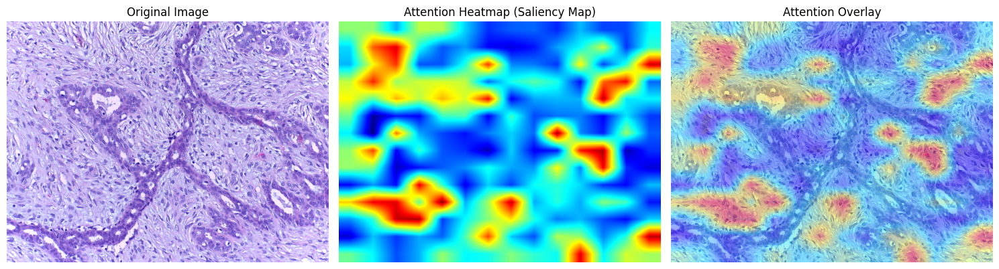


Processing InSitu image: ./Photos/InSitu/is081.tif


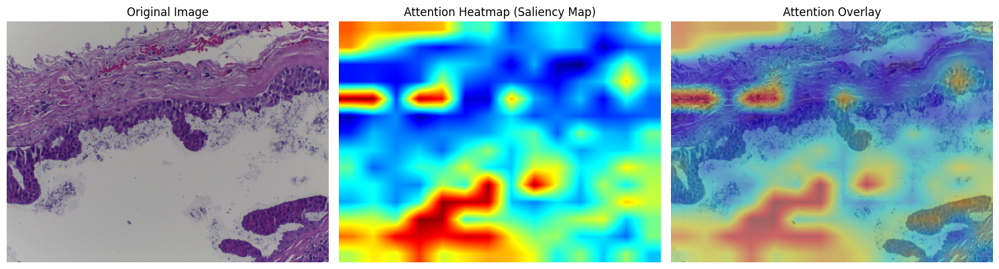


Processing Invasive image: ./Photos/Invasive/iv013.tif


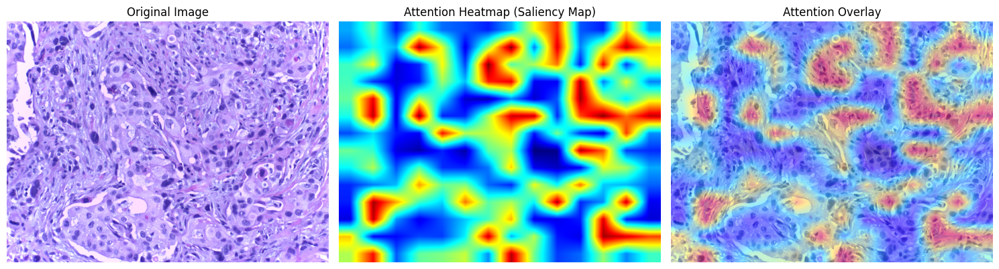


Processing Normal image: ./Photos/Normal/n084.tif


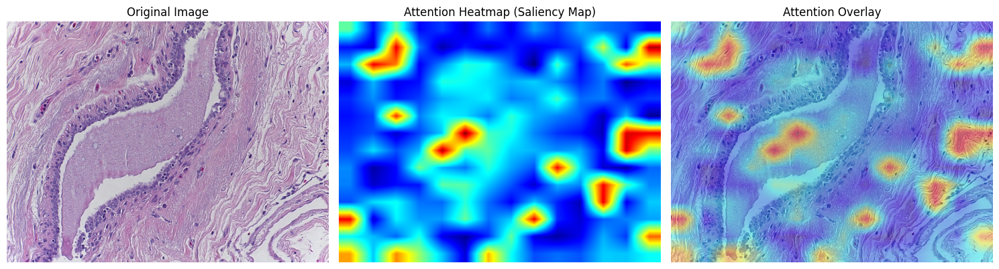

In [29]:
# Visualize examples from different classes
print("\nVisualizing examples from different classes:")
for class_name in subdirs:
    if class_name != 'Unknown':
        # Get a sample image from this class
        class_path = os.path.join("./Photos", class_name)
        if os.path.exists(class_path):
            image_files = [f for f in os.listdir(class_path) if f.endswith('.tif')]
            if image_files:
                random_image = random.choice(image_files)
                sample_path = os.path.join(class_path, random_image)
                print(f"\nProcessing {class_name} image: {sample_path}")
                visualize_attention_map(sample_path, model, data_transforms)

In [15]:
# Cleanup cell to remove any hooks
import gc

# Remove all hooks
for module in model.modules():
    module._backward_hooks.clear()
    module._backward_pre_hooks.clear()
    module._forward_hooks.clear()
    module._forward_pre_hooks.clear()

# Garbage collect
gc.collect()
torch.cuda.empty_cache() if torch.cuda.is_available() else None

print("Hooks removed and memory cleared")

Hooks removed and memory cleared


## Attention Visualization

Attention visualization helps us understand which parts of the image the Vision Transformer is focusing on when making predictions. This is crucial for:

1. **Model Interpretability**: Understanding why the model makes certain decisions
2. **Identifying Focus Areas**: Seeing which regions contain important diagnostic features
3. **Debugging Biases**: Checking if the model is focusing on irrelevant features or artifacts
4. **Clinical Trust**: Providing evidence that the model is looking at medically relevant regions

In the visualizations:
- **Left**: Original histopathology image
- **Middle**: Attention heatmap from the [CLS] token to all image patches
- **Right**: Attention overlay on the original image

Warmer colors (red/yellow) indicate regions with higher attention, while cooler colors (blue/green) indicate regions with lower attention.

We visualize attention from different layers to understand how the model processes information hierarchically:
- **Early layers**: Typically focus on low-level features and local patterns
- **Middle layers**: Combine features into more complex structures
- **Later layers**: Focus on the most discriminative regions for classification

## Visualizing Patches from CLAM

Let's visualize the patches created by the simple patch extraction script to understand how the images are being divided for feature extraction.

Loading patches from: ../CLAM/results_simple/patches/b001.h5
Loading image from: ../CLAM/../data/Photos/Benign/b001.tif

Image dimensions: 2048 x 1536
Patch size: 224 x 224
Number of patches: 54
First 5 patch coordinates:
[[  0   0]
 [224   0]
 [448   0]
 [672   0]
 [896   0]]


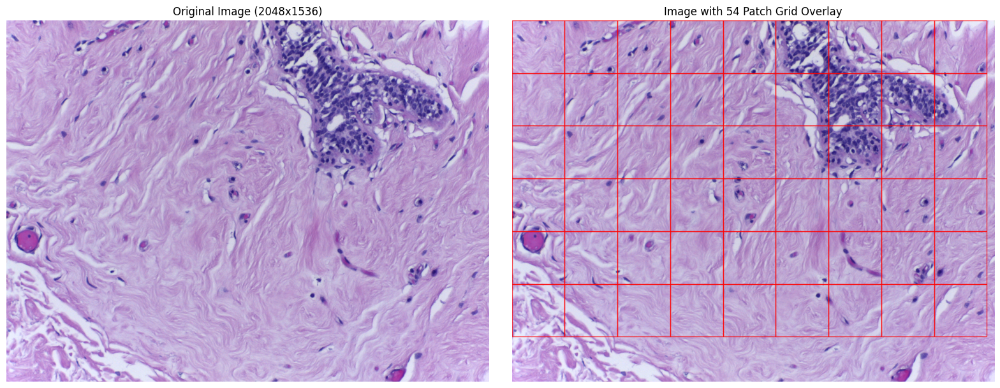


Each red square represents a 224x224 patch that will be extracted for feature extraction.


In [34]:
import h5py
import os

# Path to the patches created by create_simple_patches.py
patches_dir = "../CLAM/results_simple/patches"
images_dir = "../CLAM/../data/Photos/Benign"

# Select a sample image to visualize
sample_h5_file = "b001.h5"
sample_image_file = "b001.tif"

# Load the h5 file with patch coordinates
h5_path = os.path.join(patches_dir, sample_h5_file)
image_path = os.path.join(images_dir, sample_image_file)

print(f"Loading patches from: {h5_path}")
print(f"Loading image from: {image_path}")

# Read the h5 file
with h5py.File(h5_path, 'r') as f:
    coords = f['coords'][:]
    img_width = f.attrs['img_width']
    img_height = f.attrs['img_height']
    patch_size = f.attrs['patch_size']
    
    print(f"\nImage dimensions: {img_width} x {img_height}")
    print(f"Patch size: {patch_size} x {patch_size}")
    print(f"Number of patches: {len(coords)}")
    print(f"First 5 patch coordinates:\n{coords[:5]}")

# Load the original image
original_image = Image.open(image_path).convert('RGB')

# Visualize the grid of patches on the original image
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Show original image
axes[0].imshow(original_image)
axes[0].set_title(f"Original Image ({img_width}x{img_height})")
axes[0].axis('off')

# Show image with patch grid overlay
axes[1].imshow(original_image)
for coord in coords:
    x, y = coord
    rect = plt.Rectangle((x, y), patch_size, patch_size, 
                         linewidth=1, edgecolor='red', facecolor='none', alpha=0.7)
    axes[1].add_patch(rect)
axes[1].set_title(f"Image with {len(coords)} Patch Grid Overlay")
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"\nEach red square represents a {patch_size}x{patch_size} patch that will be extracted for feature extraction.")

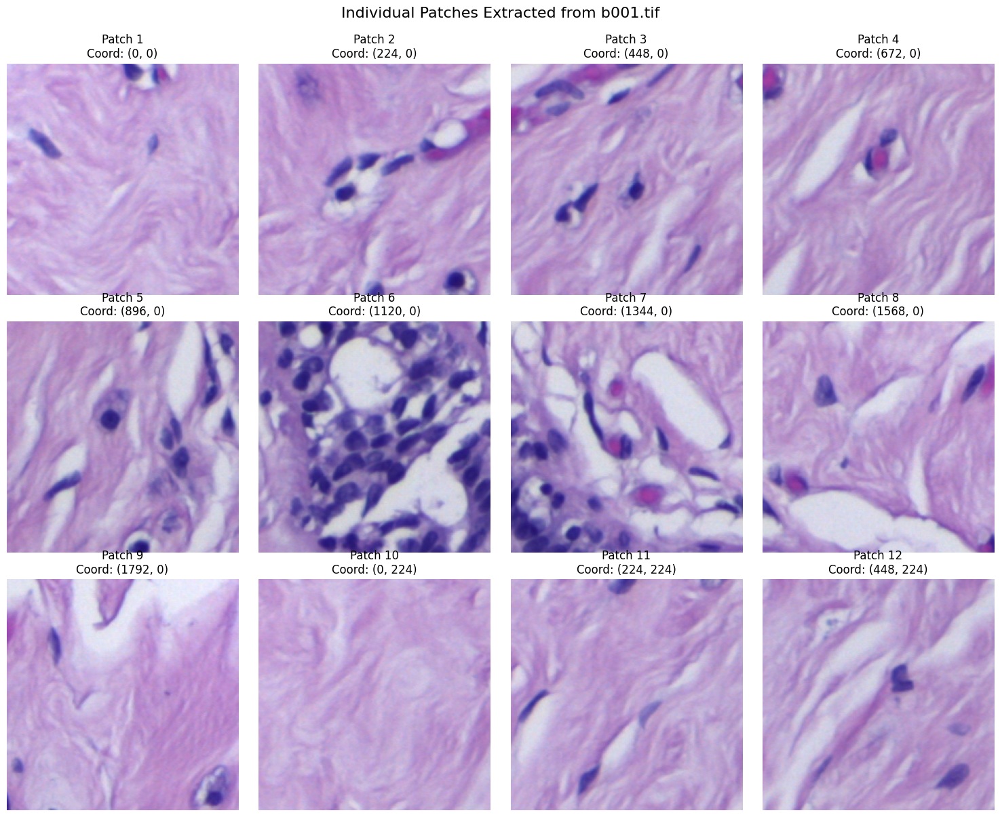


These 12 patches show what the feature extraction model will process.


In [35]:
# Visualize individual extracted patches
num_patches_to_show = 12  # Show first 12 patches
cols = 4
rows = (num_patches_to_show + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows))
axes = axes.flatten() if num_patches_to_show > 1 else [axes]

original_np = np.array(original_image)

for i in range(min(num_patches_to_show, len(coords))):
    x, y = coords[i]
    # Extract the patch from the original image
    patch = original_np[y:y+patch_size, x:x+patch_size, :]
    
    axes[i].imshow(patch)
    axes[i].set_title(f"Patch {i+1}\nCoord: ({x}, {y})")
    axes[i].axis('off')

# Hide extra subplots if any
for i in range(num_patches_to_show, len(axes)):
    axes[i].axis('off')

plt.suptitle(f"Individual Patches Extracted from {sample_image_file}", fontsize=16, y=1.0)
plt.tight_layout()
plt.show()

print(f"\nThese {num_patches_to_show} patches show what the feature extraction model will process.")

Analyzing patches across all benign images...

Analyzed 10 images:
Average number of patches per image: 54.0
Min patches: 54
Max patches: 54

Image dimensions: (2048, 1536)
Total patches across all 100 benign images: 5400


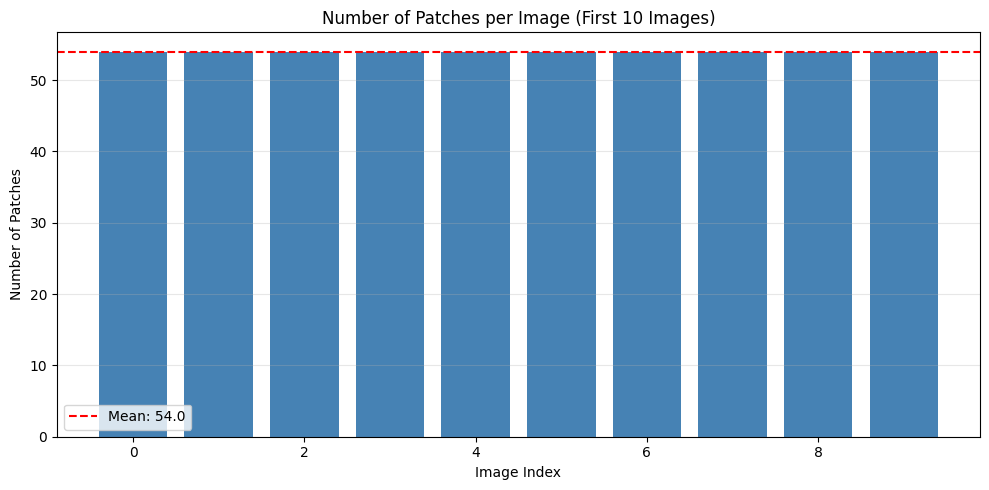

In [36]:
# Statistics about the patches across multiple images
print("Analyzing patches across all benign images...")

h5_files = [f for f in os.listdir(patches_dir) if f.endswith('.h5')]
h5_files.sort()

patch_counts = []
image_dimensions = []

for h5_file in h5_files[:10]:  # Analyze first 10 images
    h5_path = os.path.join(patches_dir, h5_file)
    with h5py.File(h5_path, 'r') as f:
        patch_counts.append(len(f['coords']))
        image_dimensions.append((f.attrs['img_width'], f.attrs['img_height']))

print(f"\nAnalyzed {len(h5_files[:10])} images:")
print(f"Average number of patches per image: {np.mean(patch_counts):.1f}")
print(f"Min patches: {np.min(patch_counts)}")
print(f"Max patches: {np.max(patch_counts)}")
print(f"\nImage dimensions: {image_dimensions[0]}")
print(f"Total patches across all {len(h5_files)} benign images: {len(h5_files) * int(np.mean(patch_counts))}")

# Visualize patch distribution
plt.figure(figsize=(10, 5))
plt.bar(range(len(patch_counts)), patch_counts, color='steelblue')
plt.xlabel('Image Index')
plt.ylabel('Number of Patches')
plt.title('Number of Patches per Image (First 10 Images)')
plt.axhline(y=np.mean(patch_counts), color='r', linestyle='--', label=f'Mean: {np.mean(patch_counts):.1f}')
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()